# 1. Import modules and load MERFISH data 

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import anndata
import scanpy as sc
import os

import matplotlib.pyplot as plt

sc.settings.n_jobs = 24
sc.settings.set_figure_params(dpi=150, dpi_save=300, frameon=False, figsize=(3,3), fontsize=7.5, facecolor='white')

# 2. Load MERLin analysis results

In [47]:
merlin_output_folder = r'\\10.245.74.158\Chromatin_NAS_8\MERFISH\human\20221025-hM1_hM1'
# generate post-analysis folders
postanalysis_folder = os.path.join(merlin_output_folder, 'PostAnalysis')
if not os.path.exists(postanalysis_folder):
    print(f"Create postanalysis_folder: {postanalysis_folder}")
    os.makedirs(postanalysis_folder)
else:
    print(f"Use postanalysis_folder: {postanalysis_folder}")

Use postanalysis_folder: \\10.245.74.158\Chromatin_NAS_8\MERFISH\human\20221025-hM1_hM1\PostAnalysis


In [48]:
figure_folder = os.path.join(postanalysis_folder, 'Figures')
if not os.path.exists(figure_folder):
    print(f"Create figure_folder: {figure_folder}")
    os.makedirs(figure_folder)
else:
    print(f"Use figure_folder: {figure_folder}")

sc.settings.figdir = figure_folder

Use figure_folder: \\10.245.74.158\Chromatin_NAS_8\MERFISH\human\20221025-hM1_hM1\PostAnalysis\Figures


## Load metadata

In [49]:
# Load Cell information
cell_meta_data_file = os.path.join(merlin_output_folder, 'ExportCellMetadata', 'feature_metadata.csv')
cell_meta_data = pd.read_csv(cell_meta_data_file)
cell_meta_data

,Unnamed: 0,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y
0,106854053781941182153815107656389918604,0,329.932937,-3725.012094,-186.452002,-3728.802894,-3721.221294,-190.566802,-182.337201
1,112617157888629111075464761446859297103,0,789.613008,-3862.112698,-168.254001,-3866.600098,-3857.625297,-174.690801,-161.817201
2,112740182224102778899402018334518443370,0,642.887171,-3847.592097,-49.507998,-3852.678897,-3842.505297,-54.702798,-44.313198
3,113542850049725220900964500825010720317,0,589.505356,-3672.848093,-188.342002,-3678.690893,-3667.005292,-192.942802,-183.741201
4,115844078674699752363171356433393652115,0,941.958095,-3725.336094,-75.697999,-3731.502894,-3719.169294,-81.918799,-69.477199
...,...,...,...,...,...,...,...,...,...
17182,8672912853935350987882310957828577534,395,1535.862645,-3962.213958,342.561997,-3969.082758,-3955.345157,334.937197,350.186798
17183,87577970159108631391498556752849575248,395,571.108077,-4019.507959,351.363998,-4024.594759,-4014.421159,346.817198,355.910798
17184,88418106158226354766452593274557238440,395,1461.664088,-3967.991958,272.253996,-3974.914758,-3961.069157,263.549195,280.958796
17185,94998291885755157848797176626581914973,395,186.078951,-4000.121958,289.479996,-4002.778759,-3997.465158,286.337196,292.622796


In [50]:
# Load decoded counts information
counts_file_mer = os.path.join(merlin_output_folder, 'ExportPartitionedBarcodes', 'barcodes_per_feature.csv')
df = pd.read_csv(counts_file_mer).rename(columns={'Unnamed: 0':'index'}).set_index('index')

In [51]:
# remove blanks
blanks = [_c for _c in df.columns if 'Blank-' in _c]
df = df.drop(columns=blanks)

adata = anndata.AnnData(df)
adata.obs = adata.obs.merge(cell_meta_data, left_index=True, right_on='Unnamed: 0').set_index('Unnamed: 0')

df

C:\Users\puzheng_new\AppData\Local\Temp\57\ipykernel_32936\3737320187.py:5: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = anndata.AnnData(df)


,CD52,PTPRU,MARCKSL1,RSPO1,POU3F1,RAB3B,ROR1,PTGER3,SLC44A5,ST6GALNAC5,...,SYNE2,IFI27,CDH11,ZFHX3,VAT1L,EPN2,NPTX1,ZNF536,KIAA1755,PCDH11X
index,,,,,,,,,,,,,,,,,,,,,
106854053781941182153815107656389918604,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0
112617157888629111075464761446859297103,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
112740182224102778899402018334518443370,1.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,15.0,1.0,0.0,0.0
113542850049725220900964500825010720317,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,3.0,...,0.0,0.0,0.0,0.0,0.0,2.0,33.0,0.0,0.0,1.0
115844078674699752363171356433393652115,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,6.0,2.0,3.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8672912853935350987882310957828577534,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,12.0,0.0,0.0,0.0
87577970159108631391498556752849575248,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0
88418106158226354766452593274557238440,0.0,0.0,2.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1.0,6.0,1.0,3.0,0.0,3.0,0.0,1.0,1.0,0.0


# 4. Preprocess and filter the MERFISH data 

In [52]:
# Calculate quality control metrics
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)

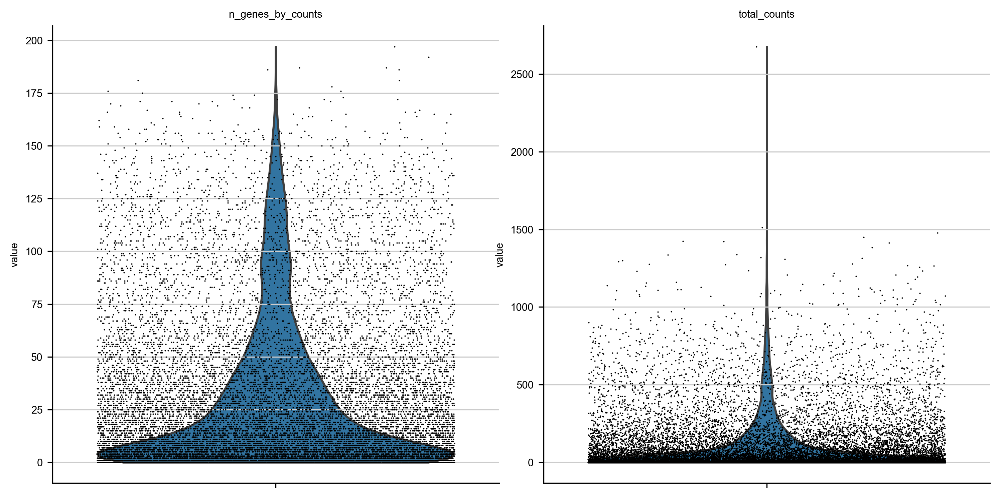

In [53]:
# A violin plot of some of the computed quality measures:
# - the number of genes expressed in the count matrix
# - the total counts per cell
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

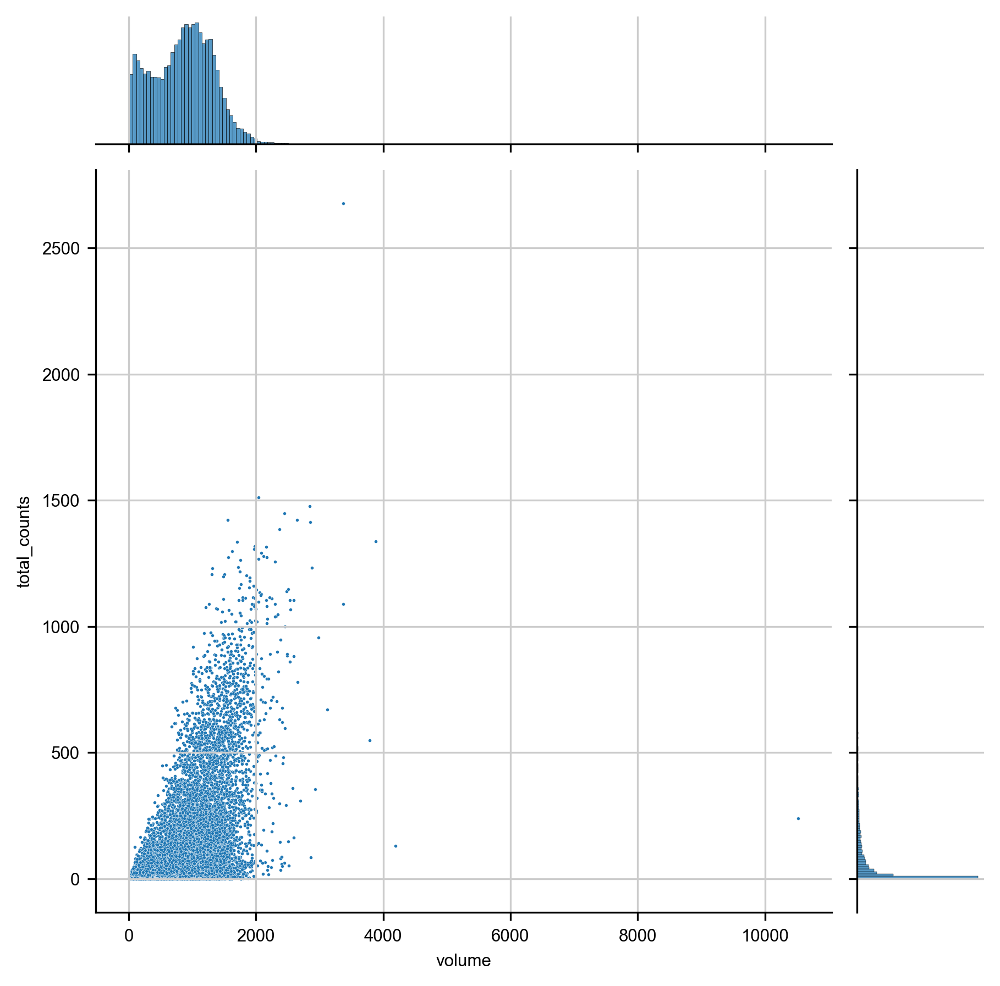

In [54]:
sns.jointplot(data=adata.obs, x='volume', y='total_counts', s=2,)

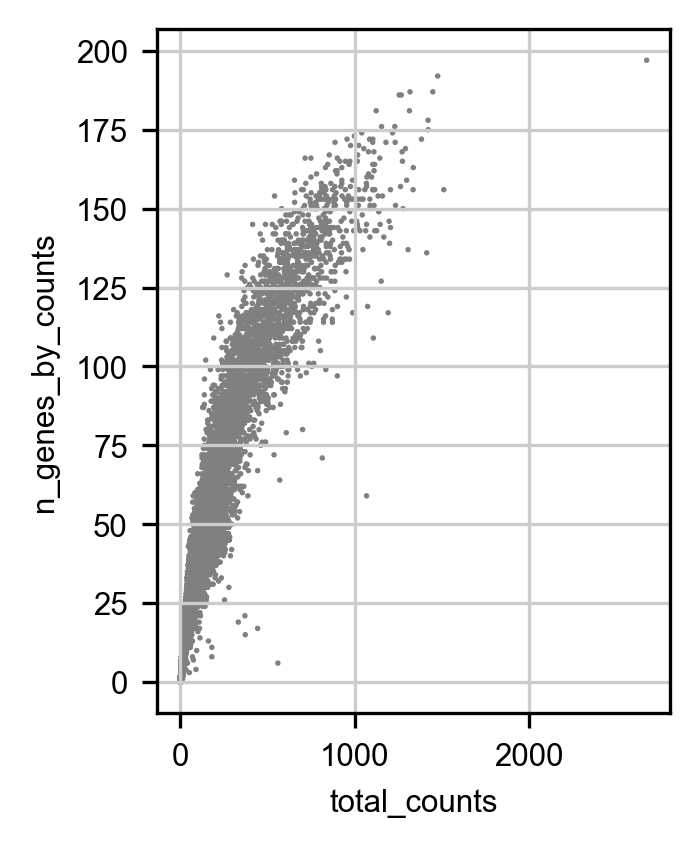

In [55]:
# Plot the distributions of gene counts
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [56]:
gene_count_threshold = 5
total_count_threshold = 10
volume_threshold = 200
volume_upper_threshold = 6000
# Filtering
adata = adata[adata.obs['n_genes_by_counts'] > gene_count_threshold]
adata = adata[adata.obs['total_counts'] > total_count_threshold]
adata = adata[adata.obs['volume'] > volume_threshold]
adata = adata[adata.obs['volume'] <= volume_upper_threshold]

print(len(adata) / len(cell_meta_data) , len(adata))

0.6187816372839937 10635


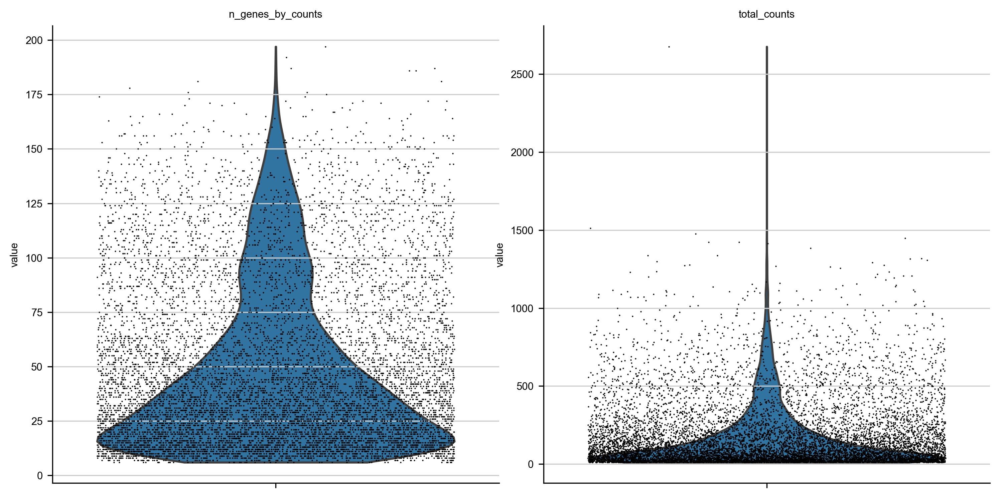

In [57]:
# A violin plot of some of the computed quality measures:
# - the number of genes expressed in the count matrix
# - the total counts per cell
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True, save='_after_filter_counts.png')

In [58]:
# plot mean count
adata.obs['total_counts'].median()

89.0

## 4. PCA and UMAP of the MERFISH data (for quick test)

E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\scanpy\preprocessing\_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


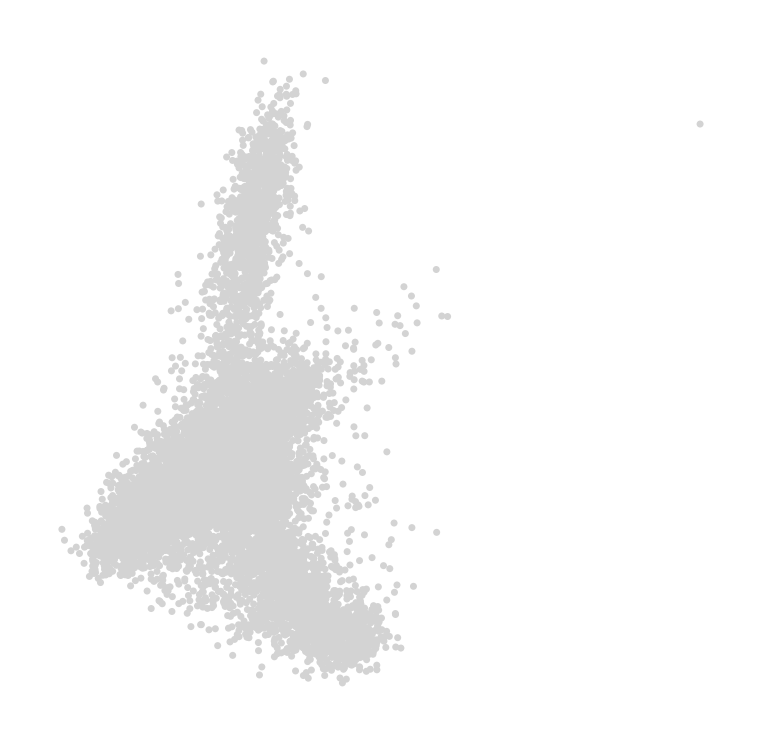

Wall time: 10.5 s


In [59]:
%%time
# Total-count normalize (library-size correct) the data matrix to 10,000 reads per cell
sc.pp.normalize_total(adata, target_sum=1e2)
# Logarithmize the data
sc.pp.log1p(adata)
# Regress out total counts
sc.pp.regress_out(adata, 'total_counts')
# Convert gene expressions to Z-scores
sc.pp.scale(adata, max_value=10)
# Principal component analysis
sc.tl.pca(adata, svd_solver='arpack')
# Plot the PCA results
sc.pl.pca(adata)

In [77]:
%%time
# Computing the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=8, n_pcs=30)

Wall time: 760 ms


In [78]:
%%time
# Clustering
sc.tl.leiden(adata, resolution=0.8)

Wall time: 1.01 s


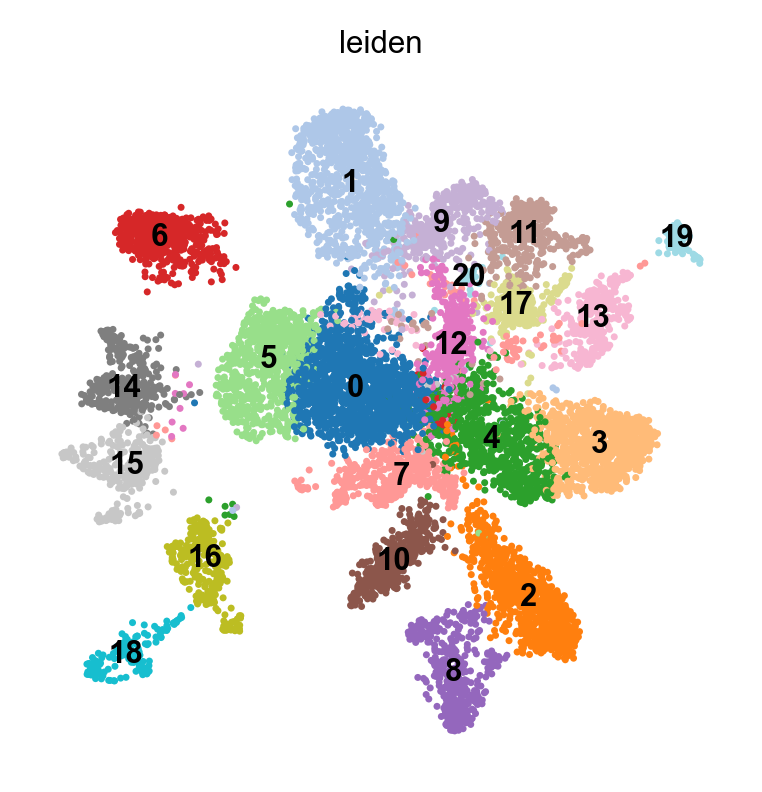

Wall time: 18.9 s


In [79]:
%%time
# Embed with UMAP
sc.tl.umap(adata)
# Plot the UMAP
sc.pl.umap(adata, color='leiden', 
           legend_loc='on data',
           palette='tab20',
           save='_cluster.png',
           )

## 5. Check count for each cell for genes of interest

In [63]:
# direcly use previous leiden
adata.obs['leiden_cluster'] = adata.obs.leiden

## T-test to identify marker genes

E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2

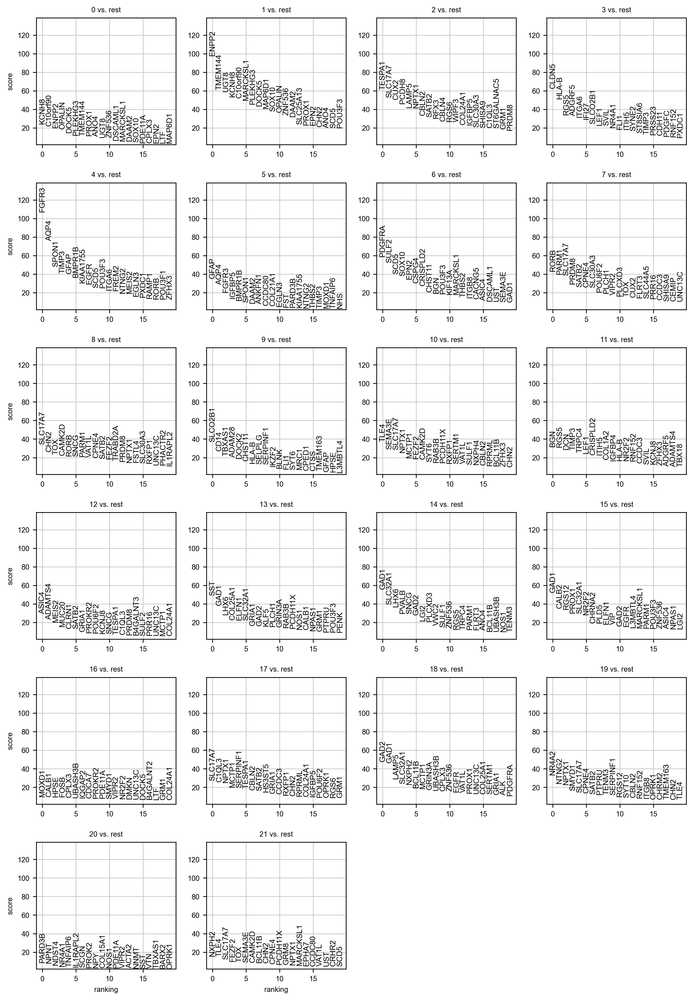

In [64]:
sc.tl.rank_genes_groups(adata, groupby='leiden_cluster', method='t-test')
sc.pl.rank_genes_groups(adata, groupby='leiden_cluster')

In [65]:
gene_ordering = np.array([list(_gnames) for _gnames in adata.uns['rank_genes_groups']['names']])

In [66]:
# assign clusters
clusters = np.sort(np.unique(adata.obs['leiden_cluster']).astype(np.int32))

# Inhibitory
inhibitory_clusters = []
for _i in clusters:
    if np.where(gene_ordering[:,_i]=='SLC32A1')[0] < 20:
        print(_i, end=', ')
        inhibitory_clusters.append(_i)
# excitatory
print("")
excitatory_clusters = []
for _i in clusters:
    if np.where(gene_ordering[:,_i]=='SLC17A7')[0] < 20:
        print(_i, end=', ')
        excitatory_clusters.append(_i)
nonneuron_clusters = []
for _i in clusters:
    if _i not in inhibitory_clusters and _i not in excitatory_clusters:
        nonneuron_clusters.append(_i)

13, 14, 15, 18, 
2, 7, 8, 10, 17, 19, 21, 

In [67]:
gene_ordering[:15, 2]

array(['TESPA1', 'SLC17A7', 'CUX2', 'PCDH8', 'LAMP5', 'NPTX1', 'CBLN2',
       'SATB2', 'RFX3', 'CBLN4', 'RGS6', 'WIPF3', 'COL24A1', 'IGFBP5',
       'SLC30A3'], dtype='<U10')

In [68]:
gene_ordering[:10, 1]

array(['ENPP2', 'TMEM144', 'UGT8', 'KCNH8', 'C10orf90', 'MARCKSL1',
       'PLEKHG3', 'DOCK5', 'MAP6D1', 'SOX10'], dtype='<U10')

In [69]:
gene_ordering[:10, 0]

array(['KCNH8', 'C10orf90', 'ENPP2', 'OPALIN', 'DOCK5', 'PLEKHG3',
       'TMEM144', 'PROX1', 'ANO4', 'UGT8'], dtype='<U10')

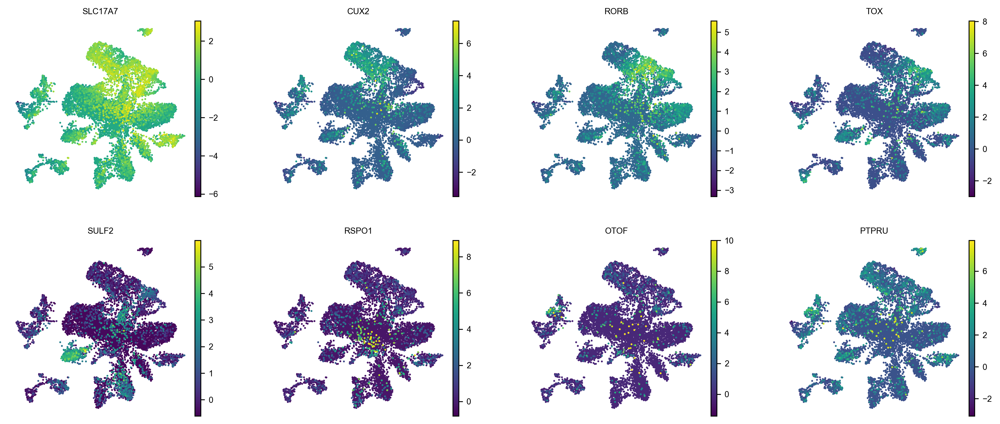

In [70]:
sc.pl.umap(adata, color=['SLC17A7','CUX2','RORB', 'TOX', 'SULF2', 'RSPO1', 'OTOF','PTPRU'])

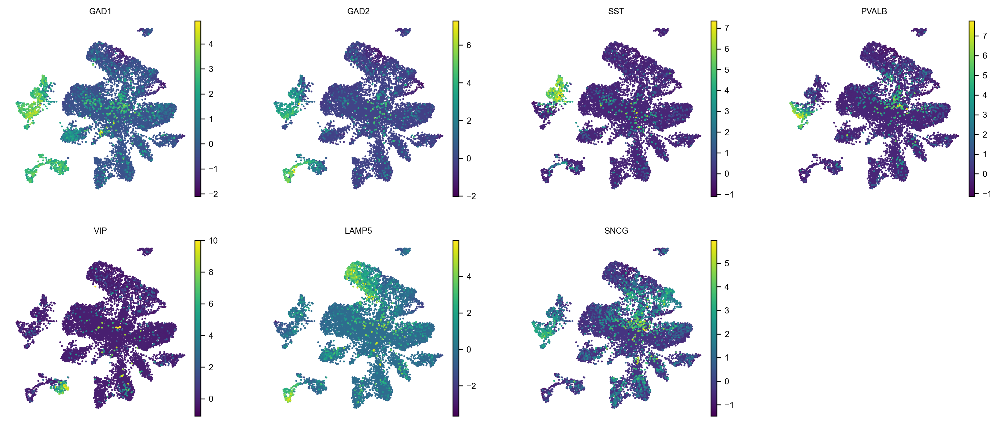

In [71]:
sc.pl.umap(adata, color=['GAD1','GAD2','SST','PVALB','VIP','LAMP5','SNCG'])

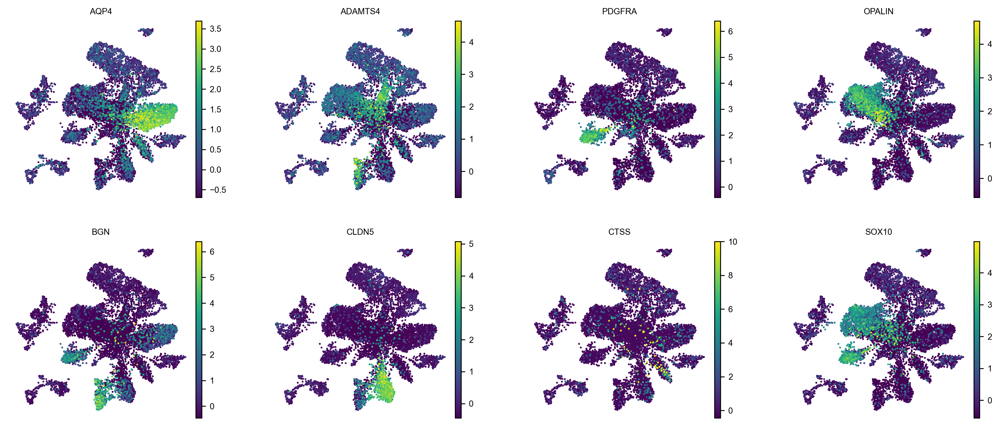

In [72]:
sc.pl.umap(adata, color=['AQP4','ADAMTS4','PDGFRA','OPALIN','BGN','CLDN5', 'CTSS', 'SOX10',])

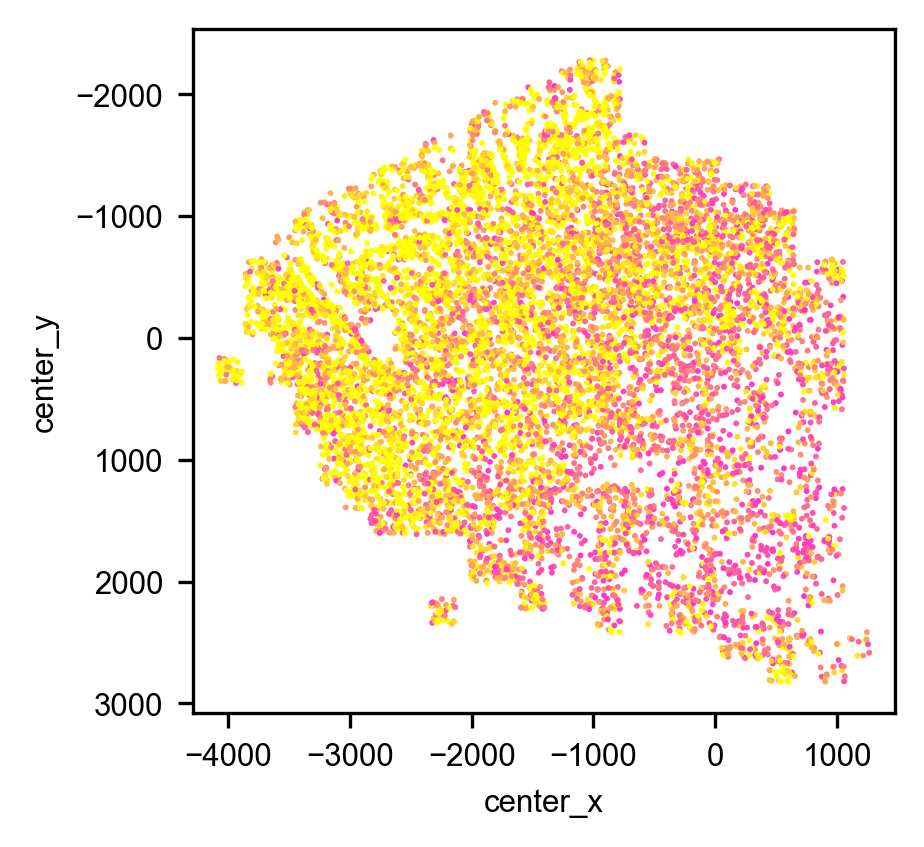

In [73]:
# visualzie the spatial dist for clusters
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
#plt.style.use('dark_background')
ax = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                     hue='total_counts', hue_norm=LogNorm(vmin=5,vmax=200), 
                     palette='spring',
                     s=2, linewidth=0,
                     legend=False, )
ax.grid(False)
ax.invert_yaxis()
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
#ax.legend(hs,ls, ncol=8, loc=8)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])
plt.savefig(os.path.join(figure_folder, 'spatial-total_counts.png'), transparent=True)
plt.show()

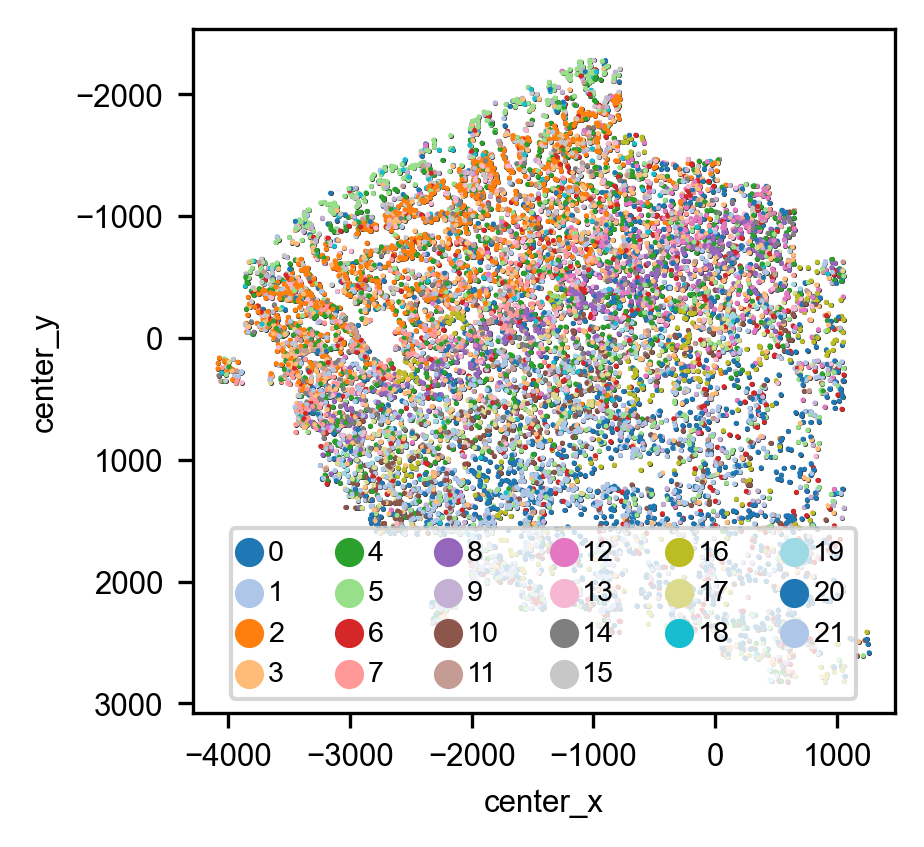

In [74]:
import matplotlib.pyplot as plt
# visualzie the spatial dist for clusters
#sel_clusters = ['0', '1', '2', '3', '4', '5']
sel_clusters = np.unique(adata.obs['leiden'])

sel_inds = [_i for _i, _cls in zip(adata.obs.index, adata.obs['leiden']) if _cls in sel_clusters]
ax1 = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                      color=[0.2,0.2,0.2], s=1.5, legend=True, linewidth=0)

ax = sns.scatterplot(data=adata.obs.loc[sel_inds], x='center_x', y='center_y', 
                     palette='tab20',
                     hue='leiden', s=1.5, legend=True, linewidth=0)
ax.grid(False)
ax.invert_yaxis()
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
ax.legend(hs,ls, ncol=6, loc=8)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])
plt.savefig(os.path.join(figure_folder, 'spatial-all_clusters.png'), transparent=True)
plt.show()

# 6.UMAP can be done using different settings and can be saved into different label column for cell type classifer use later

## 6.1 Use higher expected pcs and resolution to UMAP for cell-type distinction at "cluster" level

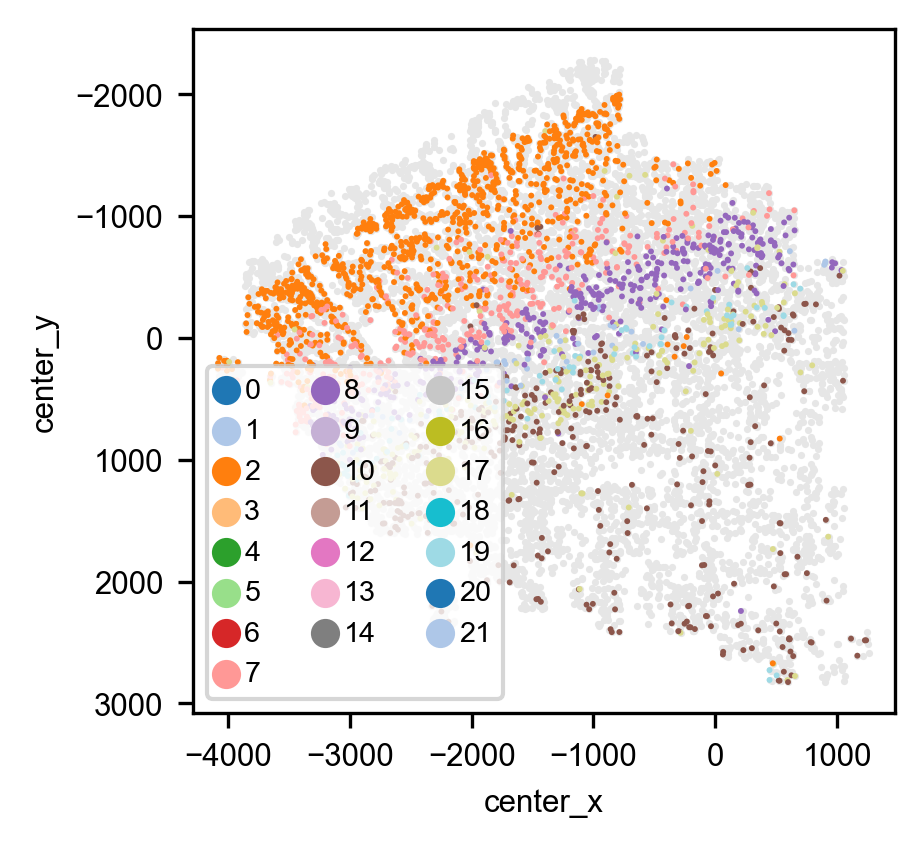

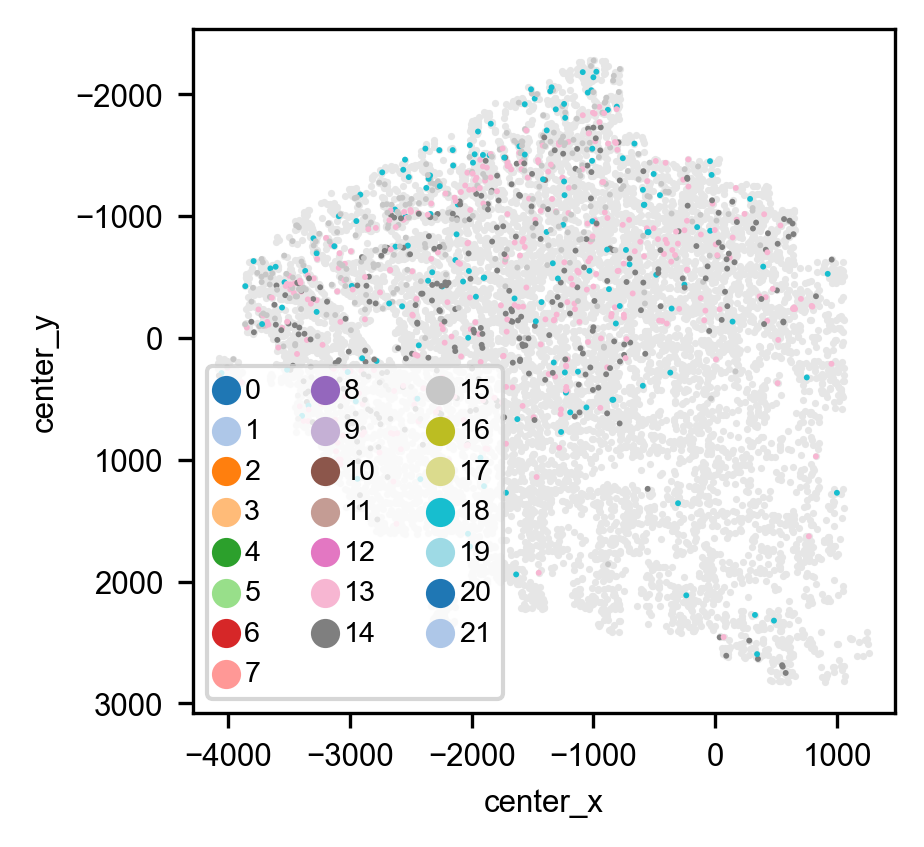

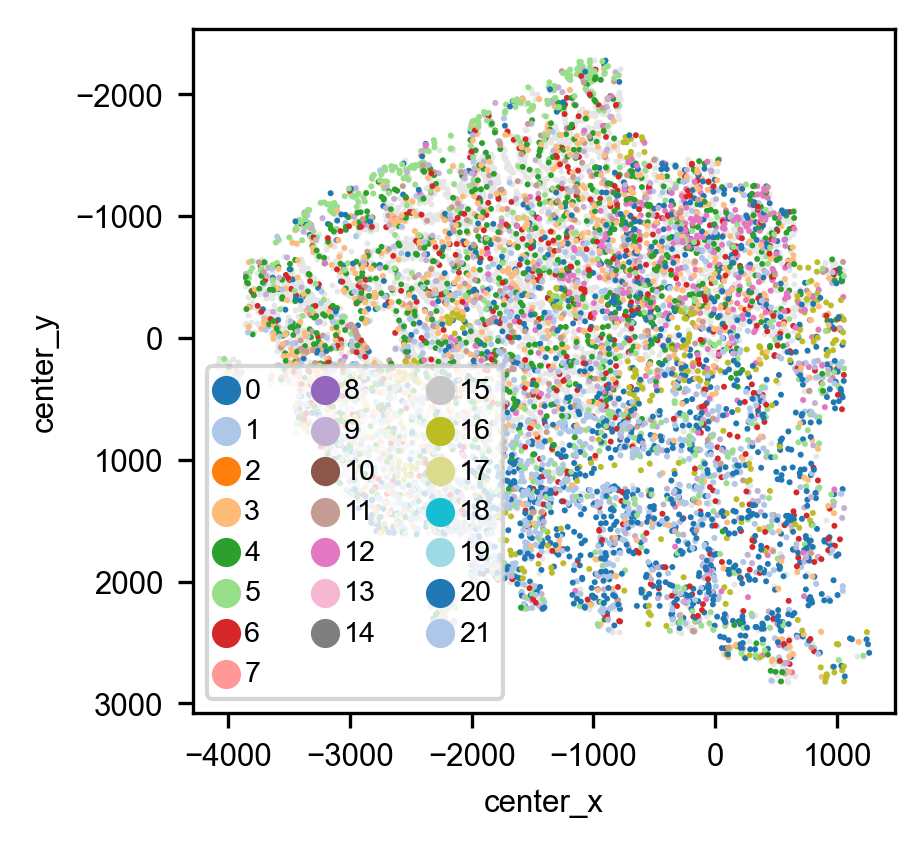

In [75]:
# visualzie the spatial dist for clusters

sel_clusters = [str(_cls) for _cls in excitatory_clusters]
sel_inds = [_i for _i, _cls in zip(adata.obs.index, adata.obs['leiden_cluster']) if str(_cls) in sel_clusters]

ax1 = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                      color=[0.9,0.9,0.9], s=3, legend=True, linewidth=0)

ax = sns.scatterplot(data=adata.obs.loc[sel_inds], x='center_x', y='center_y', 
                     palette='tab20',
                     hue='leiden_cluster', s=2, legend=True, linewidth=0)
ax.grid(False)
ax.invert_yaxis()
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
ax.legend(hs,ls, ncol=3, loc=3)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])
plt.savefig(os.path.join(figure_folder, f'spatial_excitatory_clusters.png'), transparent=True)
plt.show()


sel_clusters = [str(_cls) for _cls in inhibitory_clusters]
sel_inds = [_i for _i, _cls in zip(adata.obs.index, adata.obs['leiden_cluster']) if str(_cls) in sel_clusters]

ax1 = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                      color=[0.9,0.9,0.9], s=3, legend=True, linewidth=0)

ax = sns.scatterplot(data=adata.obs.loc[sel_inds], x='center_x', y='center_y', 
                     palette='tab20',
                     hue='leiden_cluster', s=2, legend=True, linewidth=0)
ax.grid(False)
ax.invert_yaxis()
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
ax.legend(hs,ls, ncol=3, loc=3)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])
plt.savefig(os.path.join(figure_folder, f'spatial_inhibitory_clusters.png'), transparent=True)
plt.show()


sel_clusters = [str(_cls) for _cls in nonneuron_clusters]
sel_inds = [_i for _i, _cls in zip(adata.obs.index, adata.obs['leiden_cluster']) if str(_cls) in sel_clusters]

ax1 = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                      color=[0.9,0.9,0.9], s=2., legend=True, linewidth=0)

ax = sns.scatterplot(data=adata.obs.loc[sel_inds], x='center_x', y='center_y', 
                     palette='tab20',
                     hue='leiden_cluster', s=2., legend=True, linewidth=0)
ax.grid(False)
ax.invert_yaxis()
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
ax.legend(hs,ls, ncol=3, loc=3)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])
plt.savefig(os.path.join(figure_folder, f'spatial_nonneuron_clusters.png'), transparent=True)
plt.show()

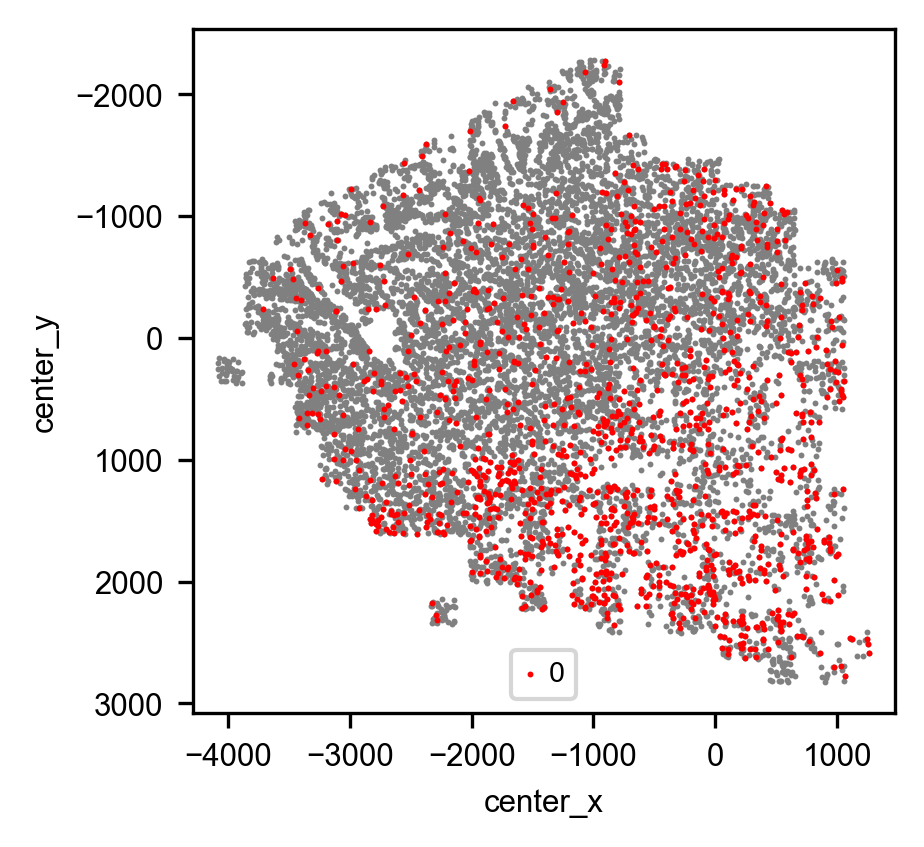

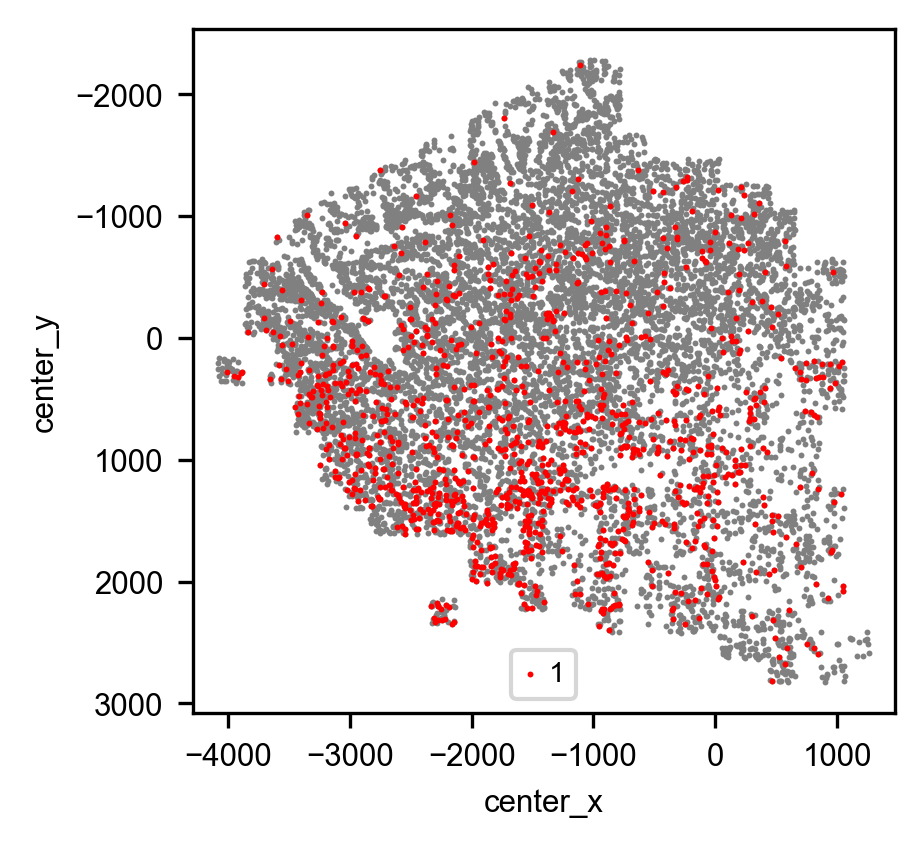

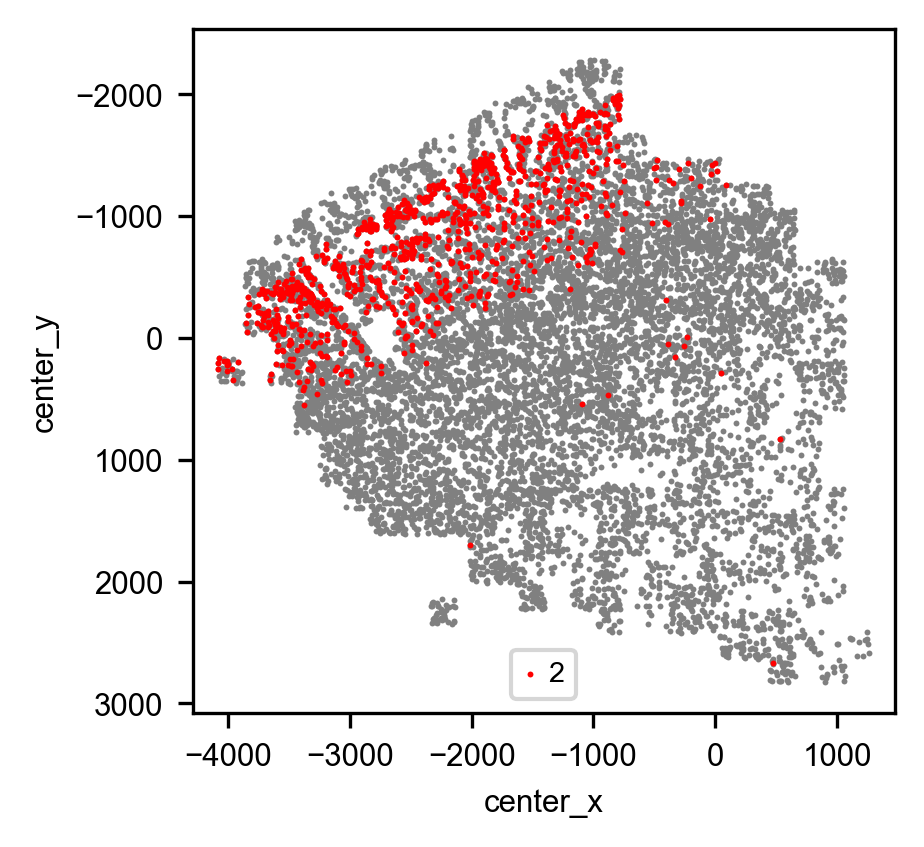

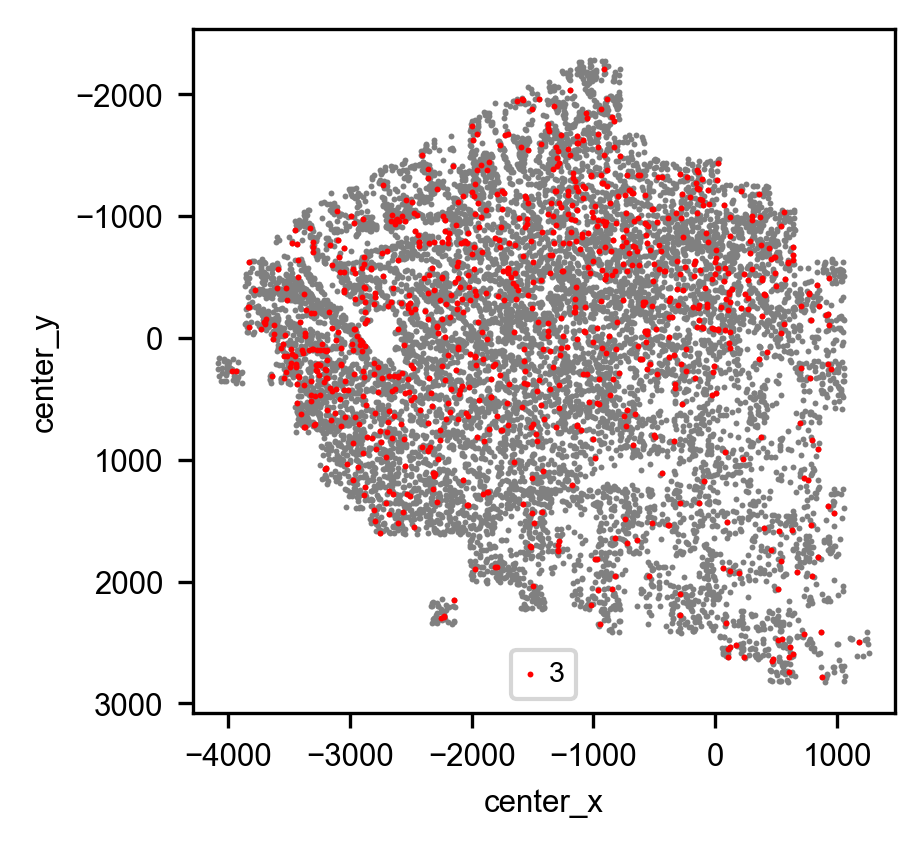

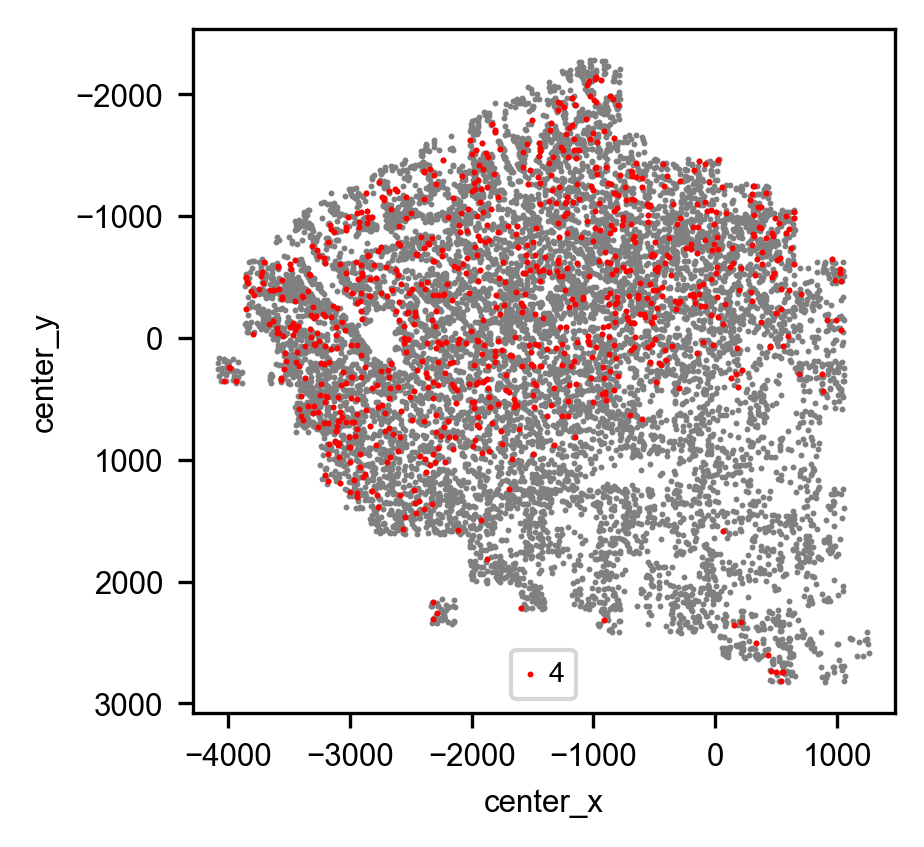

...

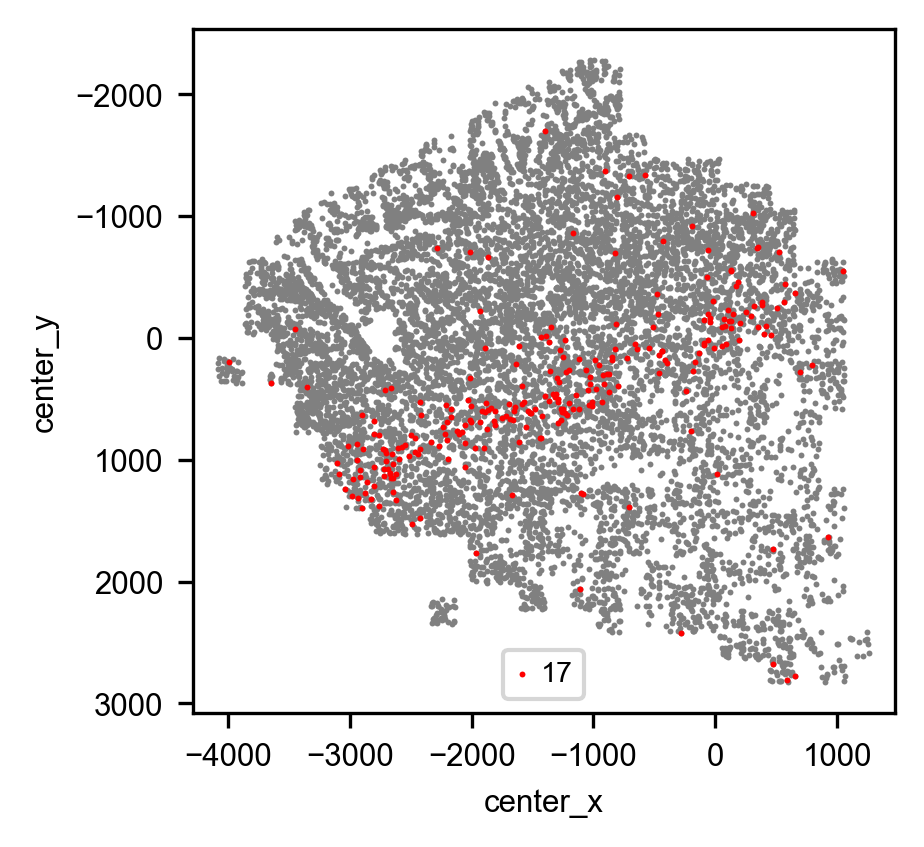

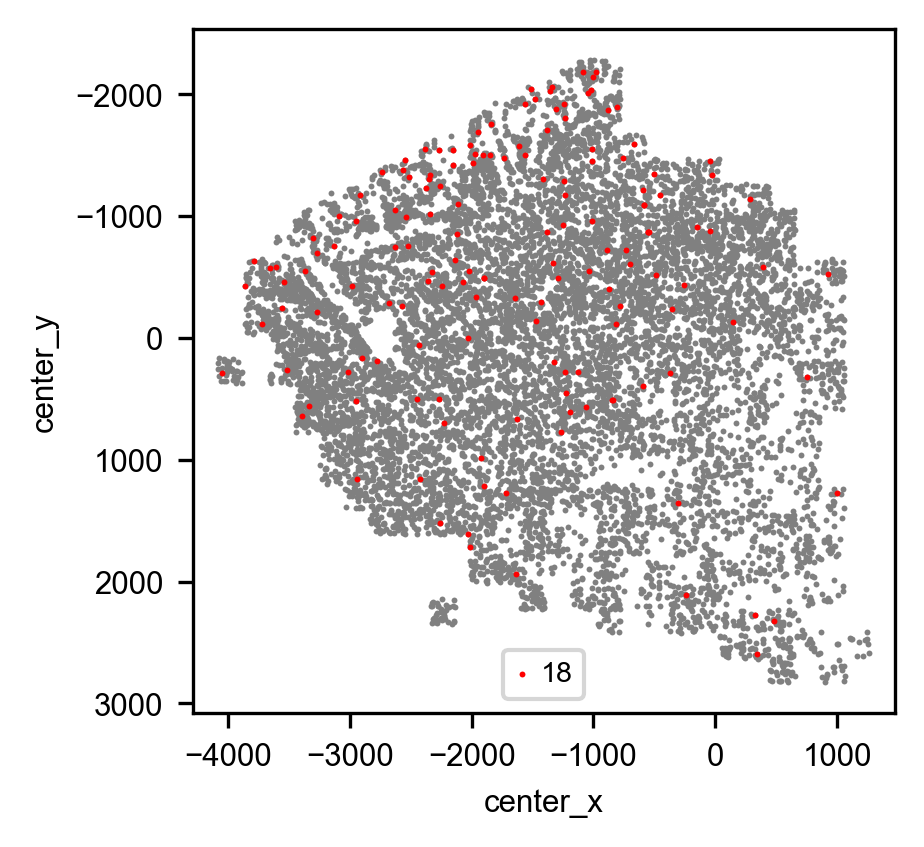

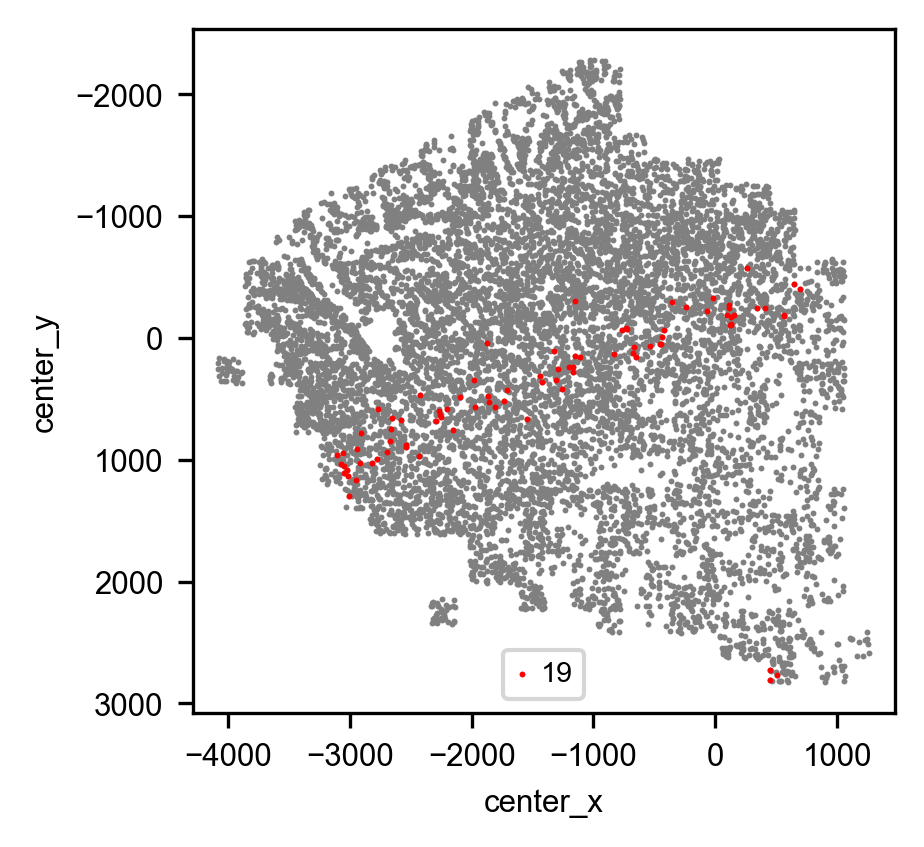

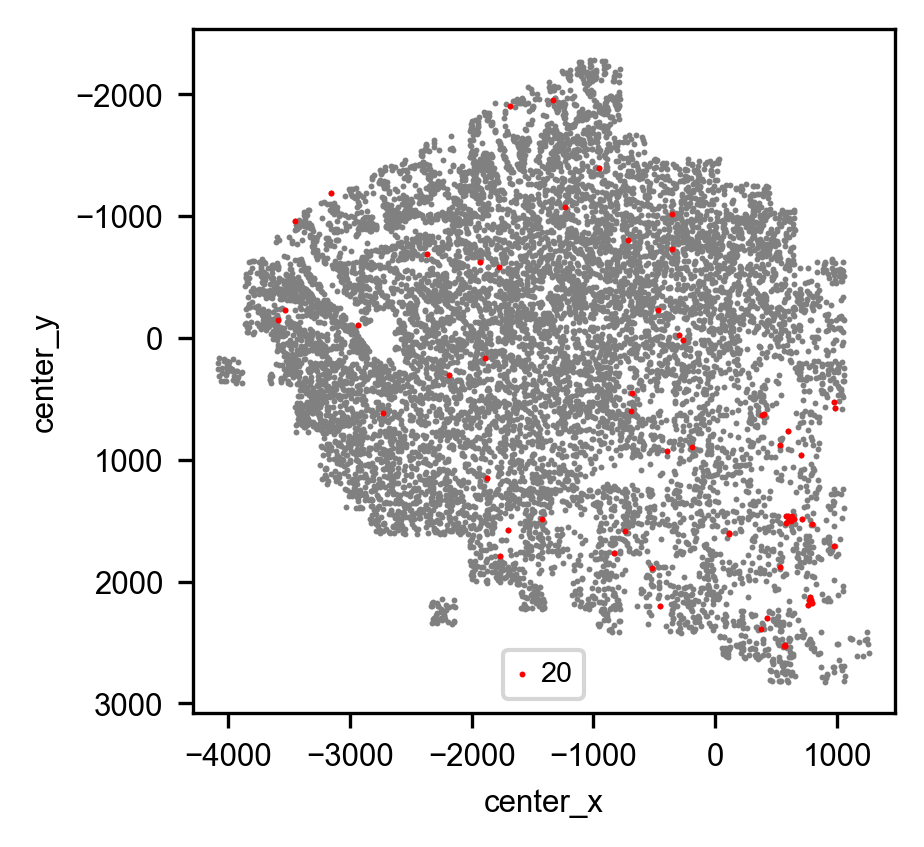

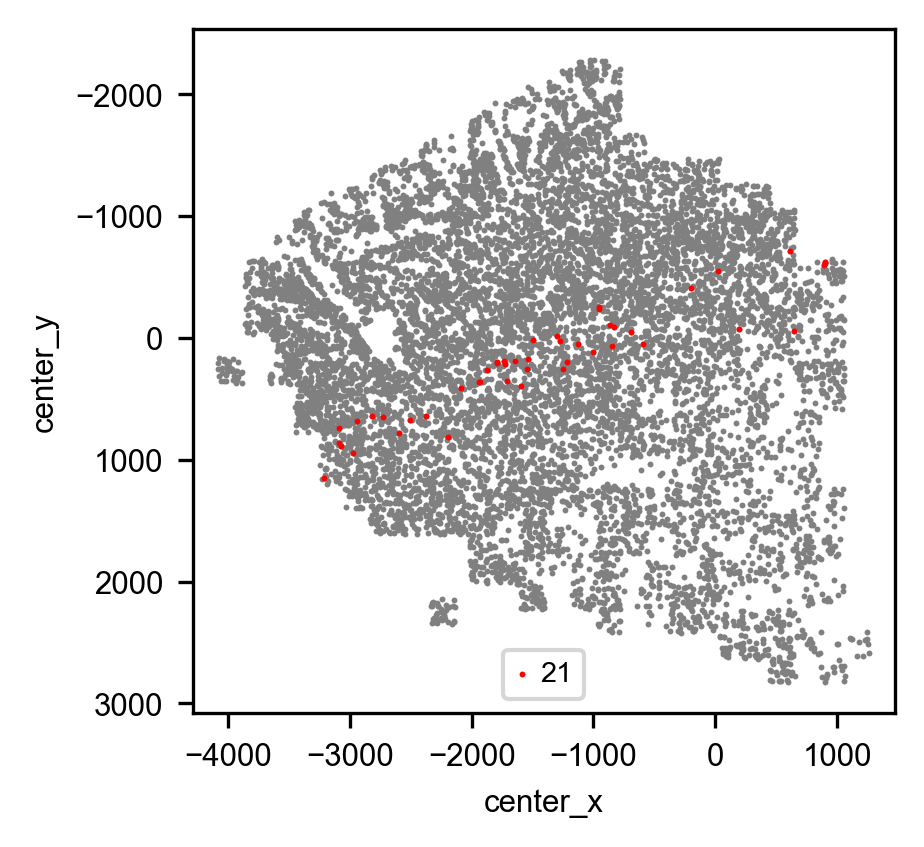

In [76]:
# visualzie the spatial dist for clusters
import matplotlib.pyplot as plt
for _class in sorted(np.unique(adata.obs['leiden_cluster']), key=lambda v:int(v)):
    #plt.style.use('dark_background')
    ax = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                    color='grey', s=2, legend=True, linewidth=0)
    ax = sns.scatterplot(data=adata.obs.loc[adata.obs['leiden_cluster']==_class], 
                         x='center_x', y='center_y', 
                    color='r', s=2, legend=True, label=_class, linewidth=0)
    ax.grid(False)
    ax.invert_yaxis()
    plt.axis('equal')
    hs, ls = ax.get_legend_handles_labels()
    ax.legend(hs,ls, ncol=8, loc=8)
    plt.show()

# 7. Save the analyzed MERFISH adata in h5ad for later use (e.g., cell classifer)

In [46]:
save_filename = os.path.join(os.path.join(postanalysis_folder, 'filtered_cluster_data.h5ad'))

overwrite = True

if not os.path.exists(save_filename) or overwrite:
    print(f"save adata into file: {save_filename}")
    adata.write(save_filename)
else:
    print(f"savefile: {save_filename} already exists")

save adata into file: \\10.245.74.158\Chromatin_NAS_8\MERFISH\human\20221025-hM1_hM1\PostAnalysis\filtered_cluster_data.h5ad
